# <강남 아파트 가격과 스타벅스 및 맥도날드의 관계 분석> 

## 1. 분석동기 

### 1) 스타벅스와 맥도날드가 근처에 있으면 집값이 오른다? 

“2015년 3월 CNN머니는  미국 부동산 업체인 질로 (https://www.zillow.com/ )의 조사 결과를 인용해 1997년에서 2013년 사이 스타벅스와 가까이 있는 주택 가격이 평균 96% 상승해 미국 전체 평균인 65%를 앞질렀다고” 보도했습니다. 

 과연 한국에서도 비슷한 현상이 일어났을까 의문이 들어 조사를 시작했습니다.  스타벅스나 맥도날드가 집 근처에 있으면 내 집 가격이 상승할 것인가? 
 
http://www.koreadaily.com/news/read.asp?art_id=3217847


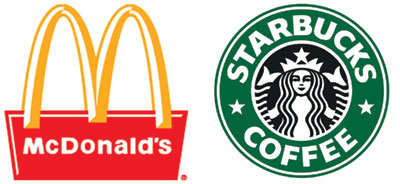

In [80]:
Image("starmc.jpg")

 ### 2) 강남을 선정하게 된 이유는?
- 강남은 starbucks 및 mcdonalds등이 다른 구보다 많아서,  아파트 값과 상관관계를 찾아보는 것에 있어서 좋은 data일 것이라고 생각 함 

### 3) 분석의 가설(귀무가설)
 -  즉 우리는 "스타벅스 및 맥도날드가 아파트 근처에 있을 수록 땅값이 비싸다."   **양의 관계**가 있을 것이라고 가정하고 이를 검토하는 것이 아래의 과정이다.

##  2. 데이터 변수 설명 

|  | 출처 |  데이터 변수  | 데이터 개수 |
|-----------------------|----------------------------------------------|----------------------|-------------|
| 아파트 실거래가 | 국토 교통부(http://rt.molit.go.kr/) | 전용면적, 가격, 주소 | 6000개 |
| 편의시설(스타벅스 등) | 각 홈페이지(http://www.istarbucks.co.kr/ 등) | 주소 | 100개 |

## 아파트 가격 from 국토부 실거래가 

국토부는 아파트 실거래가를 공개하고 있습니다. 면적, 계약년월, 가격, 층 수등을 공개 합니다.  

In [2]:
apt = pd.read_excel('a1.xlsx')

In [3]:
apt.head()

,시군구,번지,본번,부번,단지명,전용면적(㎡),계약년월,계약일,거래금액(만원),층,건축년도,도로명
0,서울특별시 강남구 개포동,655-2,655,2,개포2차현대아파트(220),77.75,201703,11~20,80000,7,1988,언주로
1,서울특별시 강남구 개포동,658-1,658,1,개포6차우성아파트1동~8동,79.97,201704,11~20,97500,4,1987,언주로
2,서울특별시 강남구 개포동,658-1,658,1,개포6차우성아파트1동~8동,79.97,201704,11~20,"98,000",1,1987,언주로
3,서울특별시 강남구 개포동,652,652,0,개포우성3차,161.00,201702,11~20,"150,000",12,1984,개포로
4,서울특별시 강남구 개포동,652,652,0,개포우성3차,104.43,201702,11~20,"108,000",11,1984,개포로


## 스타벅스, 맥도날드 from 각 홈페이지

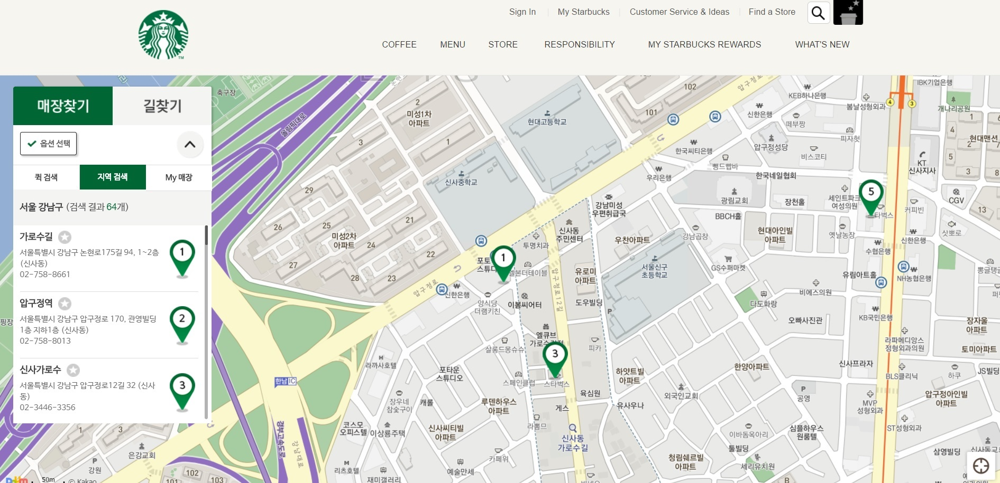

In [107]:
Image("starbucks_1.jpg")

In [1]:
# -*- coding: utf-8 -*-
# 패키지 import
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pylab as plt
import seaborn as sns
from PIL import Image
from urllib2 import Request, urlopen
from urllib import urlencode, quote_plus
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.misc import imread
import matplotlib.cbook as cbook
from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from folium.features import CustomIcon
import os
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import scale

## 3. Data 처리 방법 

## 3-(1) 아파트 데이터 처리 

### * 강남구 데이터 정리

In [53]:
import pandas as pd
xls_file = pd.ExcelFile(u"강남구.xlsx")
table = xls_file.parse()
table = table.drop([u"본번", u"부번", u"계약년월", u"계약일", u"도로명", u"층"], axis =1)
a = table[u"전용면적(㎡)"]
b = table[u"거래금액(만원)"]
c = a / 3.3
d = b/c
table[u"평당가격"] = d
table.head(10)

,시군구,번지,단지명,전용면적(㎡),거래금액(만원),건축년도,평당가격
0,서울특별시 강남구 개포동,655-2,개포2차현대아파트(220),77.75,76900,1988,3263.922830
1,서울특별시 강남구 개포동,655-2,개포2차현대아파트(220),77.75,75500,1988,3204.501608
2,서울특별시 강남구 개포동,655-2,개포2차현대아파트(220),77.75,80000,1988,3395.498392
3,서울특별시 강남구 개포동,655-2,개포2차현대아파트(220),77.75,80000,1988,3395.498392
4,서울특별시 강남구 개포동,655-2,개포2차현대아파트(220),77.75,85000,1988,3607.717042
5,서울특별시 강남구 개포동,658-1,개포6차우성아파트1동~8동,67.28,79000,1987,3874.851367
6,서울특별시 강남구 개포동,658-1,개포6차우성아파트1동~8동,67.28,83000,1987,4071.046373
7,서울특별시 강남구 개포동,658-1,개포6차우성아파트1동~8동,67.28,83000,1987,4071.046373
8,서울특별시 강남구 개포동,658-1,개포6차우성아파트1동~8동,79.97,97000,1987,4002.751032
9,서울특별시 강남구 개포동,658-1,개포6차우성아파트1동~8동,79.97,99000,1987,4085.281981


In [59]:
table_1 = table[u'평당가격'].groupby([table[u'시군구'],table[u'번지'],table[u"건축년도"]]).mean()
df = pd.DataFrame(table_1)
df.head(10)

평당가격
시군구            번지      건축년도             
 서울특별시 강남구 개포동 1164-13 2000  2422.322775
               1164-14 2000  1936.820300
               1164-20 2002  2244.435284
               1164-28 2001  1848.919589
               1164-7  2001  1898.765844
               12      1992  4805.360890
               12-2    2004  2979.421701
               1260-11 2006  1926.810072
               138     1982  7921.538436
               141     1982  7700.288375

###  * Google map API 를 APT주소 이용한 GPS 좌표변환

In [ ]:
import googlemaps
gmaps = googlemaps.Client(key="##")
a_list = []
b_list = []
for i in range(len(table)):
    c = gmaps.geocode(df.index[i][0]+df.index[i][1])[0].get("geometry").get("location")
    a_list.append(c["lat"])
    b_list.append(c["lng"])
df["경도"] = a_list
df["위도"] = b_list


In [63]:
df_22 = pd.read_csv("gangnam_gps_1.csv")
df_22.head(10)

,시군구,번지,year,price,y,x
0,서울특별시 강남구 개포동,1164-13,2000,2422.322775,37.473241,127.053089
1,서울특별시 강남구 개포동,1164-14,2000,1936.820300,37.473328,127.053235
2,서울특별시 강남구 개포동,1164-20,2002,2244.435284,37.473902,127.054106
3,서울특별시 강남구 개포동,1164-28,2001,1848.919589,37.474581,127.055189
4,서울특별시 강남구 개포동,1164-7,2001,1898.765844,37.472775,127.052374
5,서울특별시 강남구 개포동,12,1992,4805.360890,37.493965,127.075098
6,서울특별시 강남구 개포동,12월 02일,2004,2979.421701,37.496088,127.076736
7,서울특별시 강남구 개포동,1260-11,2006,1926.810072,37.479315,127.048904
8,서울특별시 강남구 개포동,138,1982,7921.538436,37.484113,127.067294
9,서울특별시 강남구 개포동,141,1982,7700.288375,37.478368,127.061484


## 3-(2) 크롤링을 이용한 스타벅스 gps 좌표

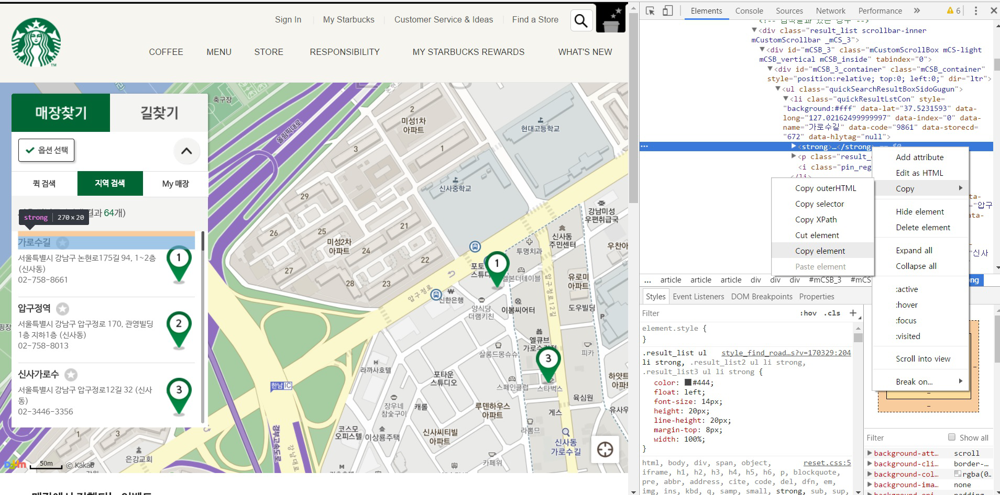

In [126]:
from PIL import Image
im = Image.open('starbucks.jpg')
im

In [65]:
from bs4 import BeautifulSoup #라이브러리 
import numpy as np
import pandas as pd

data = open('11.txt','r+')
data_1 = data.read()
Bs_read = BeautifulSoup(data_1, "html.parser")
Parsed_data = Bs_read.findAll(class_="quickResultLstCon")

gn_lat_list = []
gn_long_list = []
gn_data_list = []

for i in range(len(Parsed_data)):
    for j in range(len(Parsed_data)):
        if i == j:
            gn_lat_list.append(Parsed_data[i]["data-lat"])
            gn_long_list.append(Parsed_data[j]["data-long"])
            gn_data_list.append(Parsed_data[i]["data-name"])
        else:
            pass

In [67]:
df_gangnam_star = pd.DataFrame({
        'name': gn_data_list,
        'lat': gn_lat_list,
        'long': gn_long_list
    },columns=['name', 'lat', 'long']
)
df_gangnam_star.to_csv("gangnam_star_gps", sep='\t', encoding='utf-8')
df_gangnam_star.head(10)

,name,lat,long
0,가로수길,37.5231593,127.02162499999997
1,압구정역,37.52674095,127.0281105
2,신사가로수,37.521852,127.022510
3,압구정,37.526283,127.029560
4,압구정미소,37.52405601,127.027915
5,압구정로,37.52680046,127.0347174
6,신압구정,37.528115,127.036441
7,신사역,37.5162021,127.0207428
8,도산가로수길,37.51736229999999,127.02329570000006
9,을지병원사거리,37.5191632,127.0286446


 - 맥도날드도 위와 같은 방식으로 처리! 

## 4. 시각화 

## (1) 지도형태로 살펴보기 - maplotlib 이용하기

### 아파트 위치와 평당가격을 좌표평면에 그리는 함수
- 평당가격을 색깔의 진함으로 표현한다.

In [1]:
def displayAptGps():
    df = pd.read_csv('gangnam_gps.csv', na_values=[' '])
    x = df.loc[:, "x"]
    y = df.loc[:, "y"]
    z = df.loc[:, "z"]
    cm = plt.cm.get_cmap('YlOrRd')

    plt.ylim(y.min() - 0.01, y.max() + 0.01)
    plt.xlim(127.01, 127.11)
    plt.xticks(np.arange(127.01, 127.12, 0.02))
    sc = plt.scatter(x, y, s=60, alpha=1, c=z, cmap=cm, zorder=1)
    cb = plt.colorbar(sc)
    cb.set_label("Apt Price per 3.3m2")

    
    return sc

### 스타벅스 및 맥도날드 위치를 좌표평면에 그리는 함수

In [3]:
def display(filename, color, mark):
    df = pd.read_table(filename, na_values=[' '],encoding="utf-8")
    x = df.iloc[:, 3]
    y = df.iloc[:, 2]
    
    dis = plt.scatter(x, y, s=100, alpha=1, zorder=1, c=color, marker=mark)
    plt.ylim(y.min() - 0.01, y.max() + 0.01)
    plt.xlim(127.01, 127.11)

    return dis
    

###  아파트, 스타벅스, 맥도날드 위치를 지도에 Mapping하기

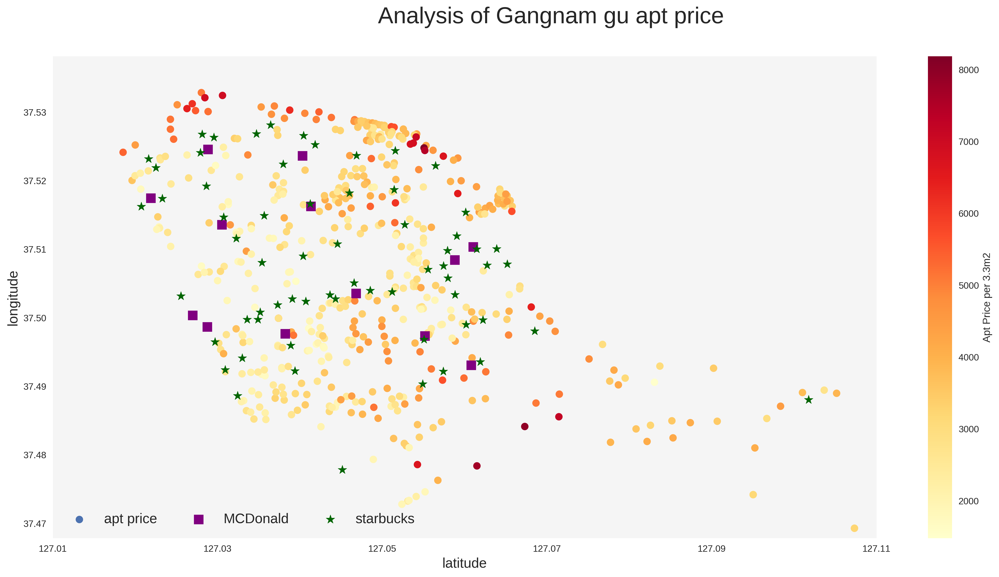

In [4]:
def main():
    fig= plt.figure(num=1, figsize=(20,10))
    plt.figtext(.5,.9,'Analysis of Gangnam gu apt price', fontsize=25, ha="center")
    ax = fig.add_subplot(111) 
    fig.subplots_adjust(top=0.85)
    apt = displayAptGps()
    mc = display('gangnam_mc_gps', 'purple', 's')
    star = display('gangnam_star_gps', 'darkgreen', '*')
    ax.set_xlabel('latitude',fontsize = 15) #xlabel
    ax.set_ylabel('longitude', fontsize = 15)#ylabel
    ax.set_facecolor('whitesmoke')
    plt.legend((apt, mc, star),
               ('apt price', 'MCDonald','starbucks'), scatterpoints=1,
               loc='lower left', ncol=3, fontsize=15)
    plt.grid(False)
    plt.show()
main()


### 위와 같이 좌표평면에 그리게 되면 도로 및 지형물 등을 고려하지 못하므로, 파이썬 다른 패키지를 이용해서 시각화 시도!

## (2) 지도형태로 살펴보기 - folium package 이용하기

- 패키지를 이용해서 강남지역 지도로 띄우기
- map1이 실행을 안시키면 사진이 안뜨는 경우가 있어서 그 밑에 캡쳐사진을 첨부

In [3]:
map1 = folium.Map(location=[37.505,127.06],zoom_start=12,tiles="Stamen Toner")
map1

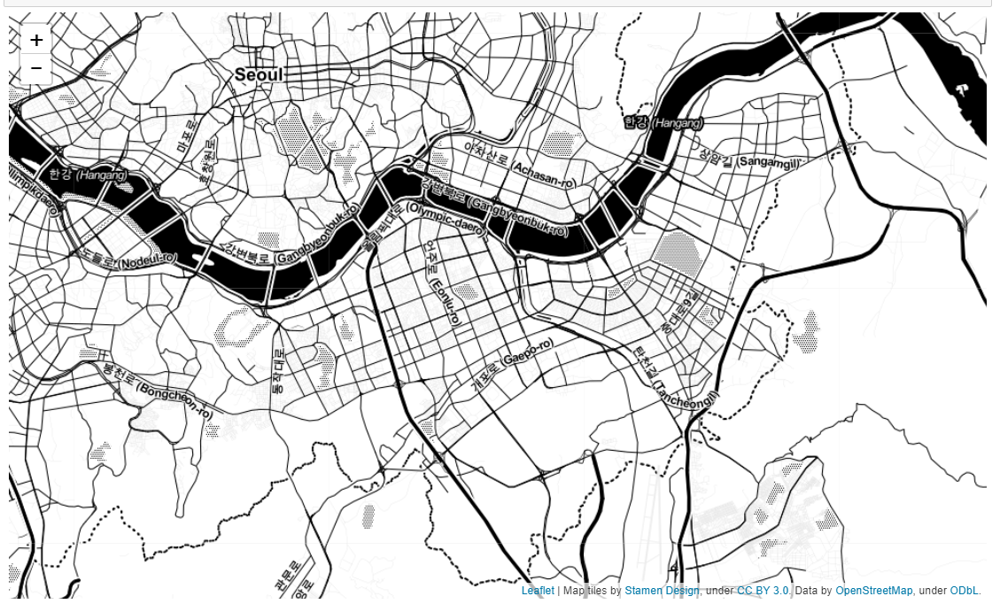

### 강남 지역 스타벅스 및 맥도날드 좌표 불러와서 마커(marker)로 표시하기

In [4]:
gangnam_star = pd.read_table("gangnam_star_gps")
gangnam_star.head()

,Unnamed: 0,name,lat,long
0,0,가로수길,37.523159,127.021625
1,1,압구정역,37.526741,127.028110
2,2,신사가로수,37.521852,127.022510
3,3,압구정,37.526283,127.029560
4,4,압구정미소,37.524056,127.027915


In [5]:
for i in range(len(gangnam_star)):
    folium.Marker([gangnam_star.iloc[i,2],gangnam_star.iloc[i,3]],popup="Star_bucks", icon=folium.Icon(icon="star",color="green")).add_to(map1)


In [6]:
gangnam_mc = pd.read_table("gangnam_mc_gps")
gangnam_mc.head()

,Unnamed: 0,강남구,위도,경도
0,0,맥도날드 한티,37.497331,127.055153
1,1,맥도날드 강남2호점,37.498643,127.028741
2,2,맥도날드 청담DT점,37.523597,127.040298
3,3,맥도날드 강남점,37.500322,127.026967
4,4,맥도날드 압구정CGV점,37.524537,127.028835


In [7]:
for i in range(len(gangnam_mc)):
    folium.Marker([gangnam_mc.iloc[i,2],gangnam_mc.iloc[i,3]],popup="Mc_donalds", icon=folium.Icon(icon="cloud",color="red",icon_color="yellow")).add_to(map1)


In [8]:
map1

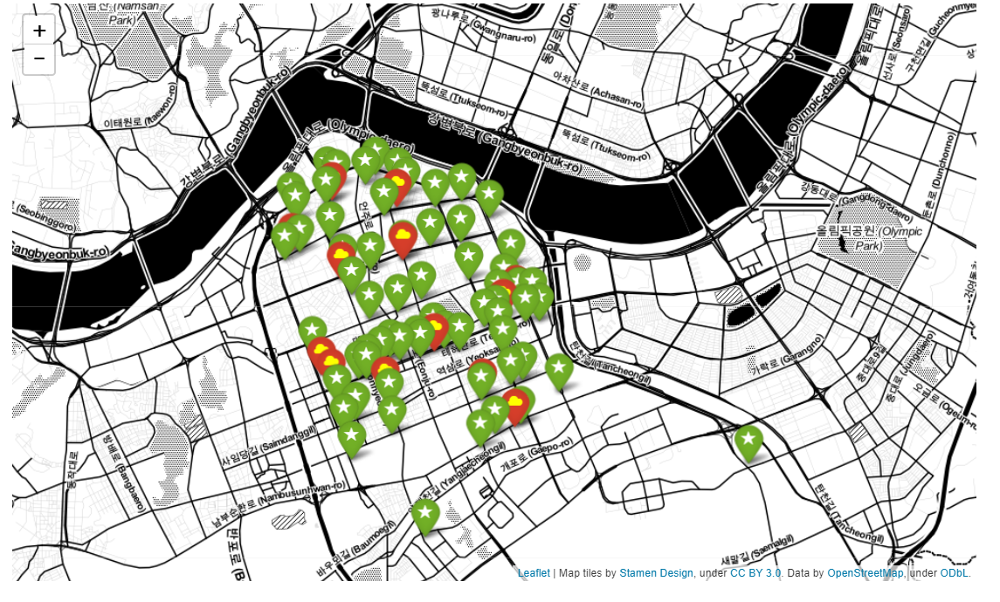

### 아파트의 가격별로 히트맵으로 표현해주기
- 아파트의 가격을 표준화시켜주고 값이 높을 수록 진한 빨간색으로 표현 됨

In [9]:
gangnam_apt = pd.read_table("gangnam_apt_gps")

In [10]:
price_scale = scale(gangnam_apt.iloc[:,2])

In [11]:
gangnam_array = gangnam_apt.iloc[:,[3,4]]

In [12]:
gangnam_array["price"] = price_scale

/home/dockeruser/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [13]:
gangnam_p = np.array(gangnam_array)
gangnam_p

array([[  37.4732407 ,  127.0530892 ,   -0.7758716 ],
       [  37.4733275 ,  127.0532351 ,   -1.18969527],
       [  37.4739021 ,  127.0541063 ,   -0.92749607],
       ..., 
       [  37.5222908 ,  127.0505578 ,    0.19078407],
       [  37.5201469 ,  127.0516426 ,    0.43342169],
       [  37.5215874 ,  127.0544198 ,    1.26262691]])

In [14]:
HeatMap(gangnam_p).add_to(map1)

In [15]:
map1

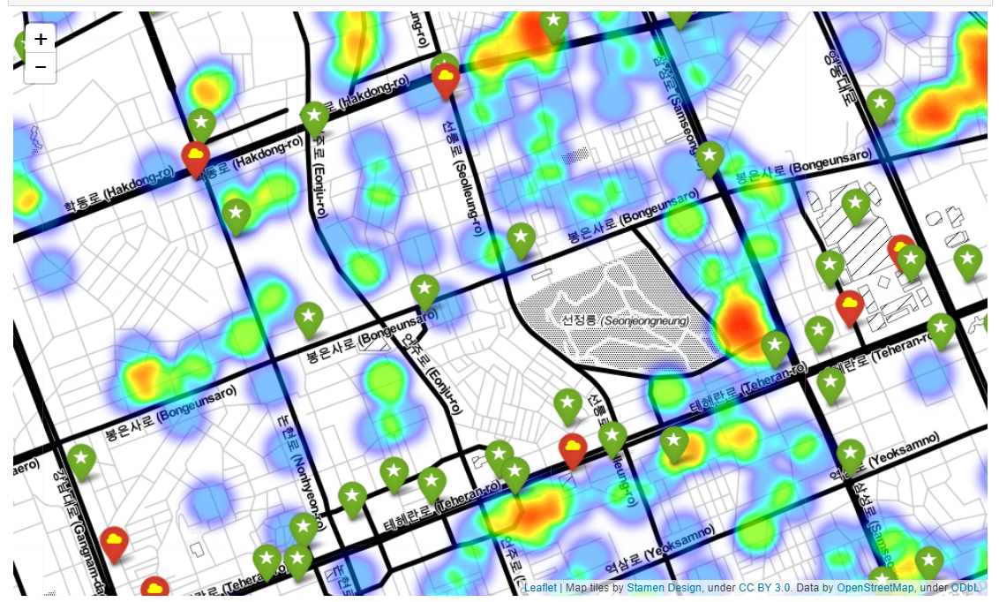

#### 2차원 좌표평면에 시각화 하면서 스타벅스의 분포 및 맥도날드의 분포의 패턴은 파악 할 수 있었다.
#### 하지만 이를 통해서 아파트 가격과의 관계를  수치적으로 파악이 불가하므로, 이하에서는 joint plot등으로 관계를 살펴보도록 하겠다.

## (2) 데이터 분포 및 관계의 시각화

### 아파트 기준으로 가장 가까운 맥도날드 및 스타벅스의 거리를 구하고, 그 거리와 아파트 값의 관계를 살펴본다.

#### *  데이터 전처리 과정

In [9]:
%precision 20

u'%.20f'

In [5]:
df_apt = pd.read_table("gangnam_gps_1")

In [6]:
del df_apt["시군구"]
del df_apt["번지"]
del df_apt["건축년도"]

In [7]:
df_apt.columns = ["price","lat","long"]
df_apt.head()

,price,lat,long
0,2422.322775,37.473241,127.053089
1,1936.820300,37.473328,127.053235
2,2244.435284,37.473902,127.054106
3,1848.919589,37.474581,127.055189
4,1898.765844,37.472775,127.052374


In [8]:
df_mc = pd.read_table("gangnam_mc_gps")
del df_mc["Unnamed: 0"]
del df_mc["강남구"]

In [9]:
df_mc.columns =  ["lat","long"]
df_mc.head()

,lat,long
0,37.497331,127.055153
1,37.498643,127.028741
2,37.523597,127.040298
3,37.500322,127.026967
4,37.524537,127.028835


In [10]:
df_star = pd.read_table("gangnam_star_gps")
del df_star["Unnamed: 0"]
del df_star["name"]

In [11]:
df_star.head()

,lat,long
0,37.523159,127.021625
1,37.526741,127.028110
2,37.521852,127.022510
3,37.526283,127.029560
4,37.524056,127.027915


#### * gps좌표를 구하는 공식은 아래의 사진과 같으므로 이를 코드로 구현하는 함수는 min_distance이다.

In [453]:
im = Image.open('gps_form.png')

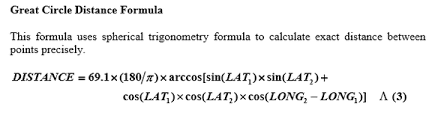

In [603]:
im

In [15]:
# gps 좌표를 거리로 계산(단위 km) 및 최소값을 array에 저장
def min_distance(y,x,name):
    
    distance_num = np.zeros(len(y))
    R = 6371
    for i in range(len(y)):
        
        lat1 = np.radians(np.array(y.iloc[i,[1,2]])[0])
        lat2 = np.radians(np.array(x)[:,0])
        lon1 = np.radians(np.array(y.iloc[i,[1,2]])[1])
        lon2 = np.radians(np.array(x)[:,1])
        dlon = lon2 - lon1 
        dlat = lat2 - lat1 
        a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
        distance = R * c 
        distance_num[i] = np.min(distance)
    
    y[name] = distance_num

In [16]:
min_distance(df_apt,df_mc,"mc_min")

In [17]:
min_distance(df_apt,df_star,"star_min")

In [18]:
df_apt.head()

,price,lat,long,mc_min,star_min
0,2422.322775,37.473241,127.053089,2.304799,0.866147
1,1936.820300,37.473328,127.053235,2.291797,0.871045
2,2244.435284,37.473902,127.054106,2.208975,0.902676
3,1848.919589,37.474581,127.055189,2.111907,0.956626
4,1898.765844,37.472775,127.052374,2.373373,0.849120


In [158]:
df_apt.to_csv("gangnam_distance.csv")

In [19]:
df_apt.head()

,price,lat,long,mc_min,star_min
0,2422.322775,37.473241,127.053089,2.304799,0.866147
1,1936.820300,37.473328,127.053235,2.291797,0.871045
2,2244.435284,37.473902,127.054106,2.208975,0.902676
3,1848.919589,37.474581,127.055189,2.111907,0.956626
4,1898.765844,37.472775,127.052374,2.373373,0.849120


In [20]:
x = df_apt["mc_min"]
y = df_apt["star_min"]
z = df_apt["price"]
w = x+y

#### * 처리된 데이터를 distplot / joinplot / regplot 으로 관계를 찾아본다.
#### * 여기서 변수 x는 맥도날드 최단거리, y는 스타벅스 최단거리, z는 평당가격, w는 x와 y의 합을 의미한다.

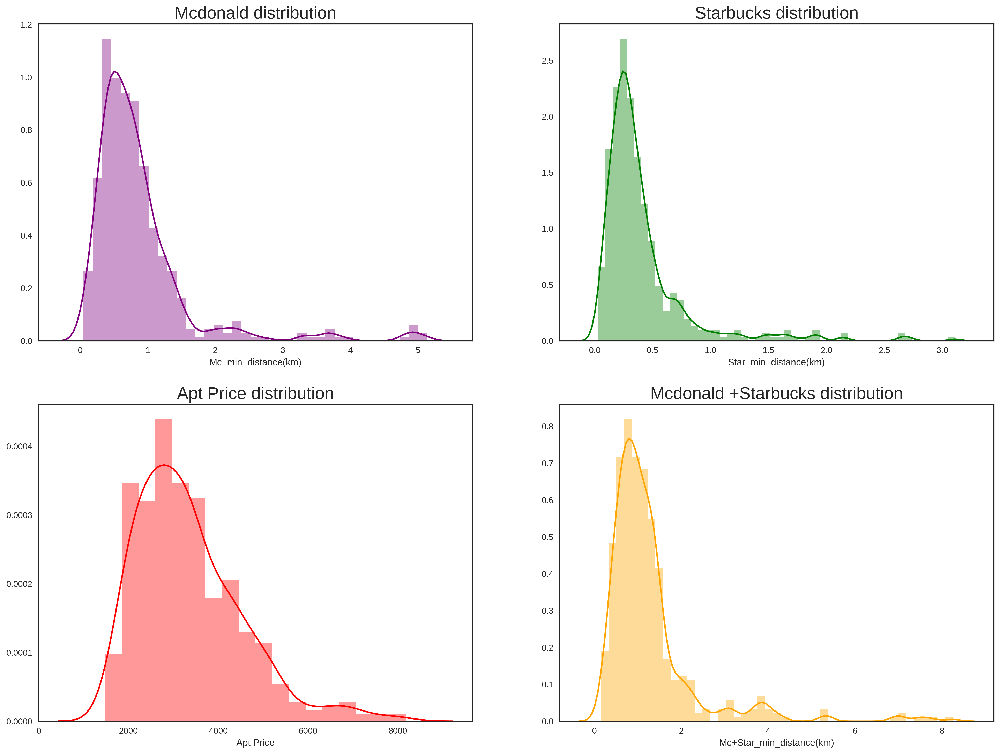

In [21]:
sns.set(style="white", color_codes=True)
fig = plt.figure(1, figsize=(20,15))

plt.subplot(221)
sns.distplot(x,color="purple")
plt.title("Mcdonald distribution", fontsize=20)
plt.xlabel("Mc_min_distance(km)")

plt.subplot(222)
sns.distplot(y, color = "green")
plt.title("Starbucks distribution", fontsize=20)
plt.xlabel("Star_min_distance(km)")

plt.subplot(223)
sns.distplot(z, color = "red")
plt.title("Apt Price distribution", fontsize=20)
plt.xlabel("Apt Price")

plt.subplot(224)
sns.distplot(w, color = "orange")
plt.title("Mcdonald +Starbucks distribution", fontsize=20)
plt.xlabel("Mc+Star_min_distance(km)")
plt.show()

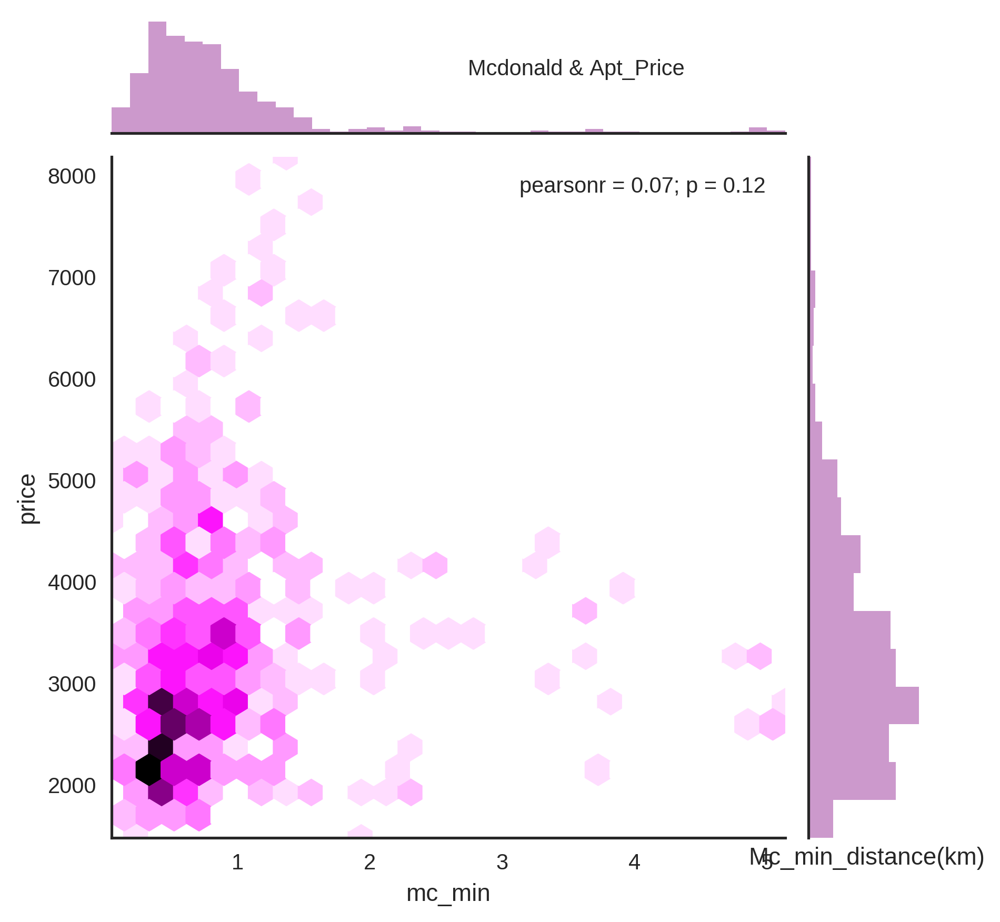

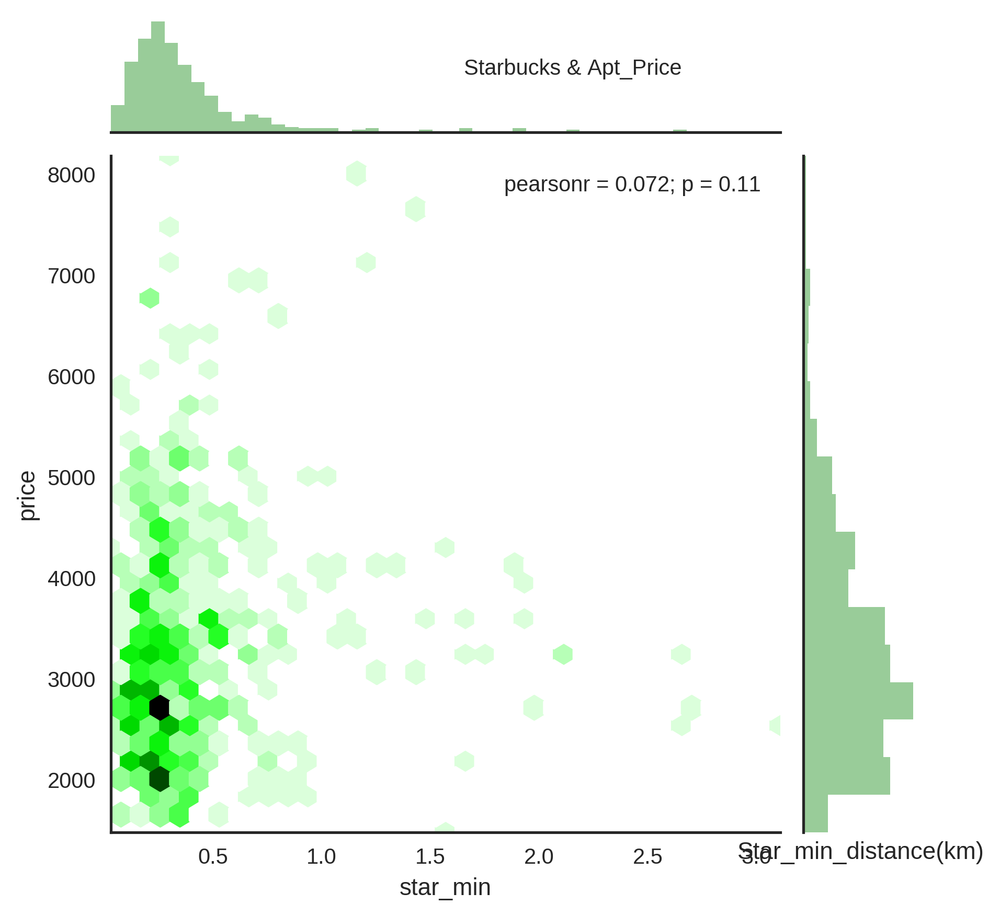

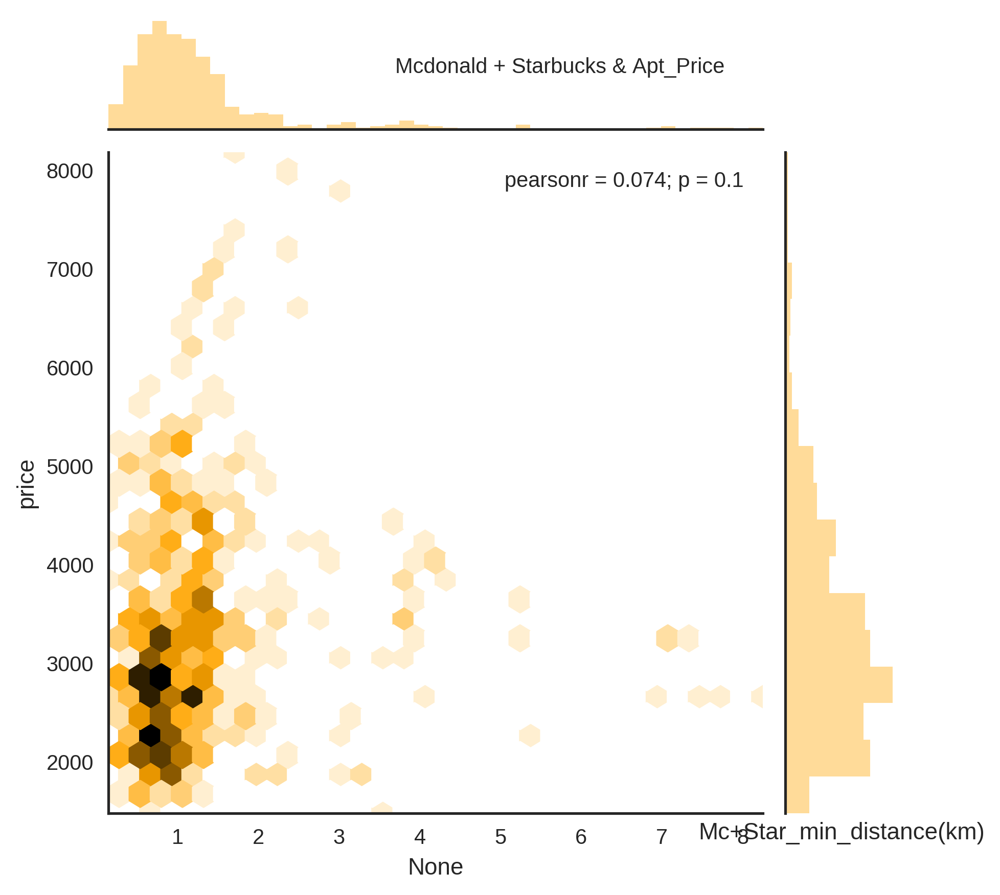

In [52]:
sns.set(style="white", color_codes=True)

sns.jointplot(x,z, color="purple",  kind="hex")
plt.title("Mcdonald & Apt_Price", fontsize=10, position=(-2, 1.1))
plt.xlabel("Mc_min_distance(km)")

ax2 =sns.jointplot(y,z, color = "green",  kind="hex")
plt.title("Starbucks & Apt_Price", fontsize=10,position=(-2, 1.1))
plt.xlabel("Star_min_distance(km)")

ax3 = sns.jointplot(w,z, color = "orange", kind="hex")
plt.title("Mcdonald + Starbucks & Apt_Price", fontsize=10,position=(-2, 1.1))
plt.xlabel("Mc+Star_min_distance(km)")

plt.show()

### jointplot으로 관계를 살펴보면 모든 관계에서 p값이 0.1이상 나와서 상관관계가 있다고 볼 수 없다.

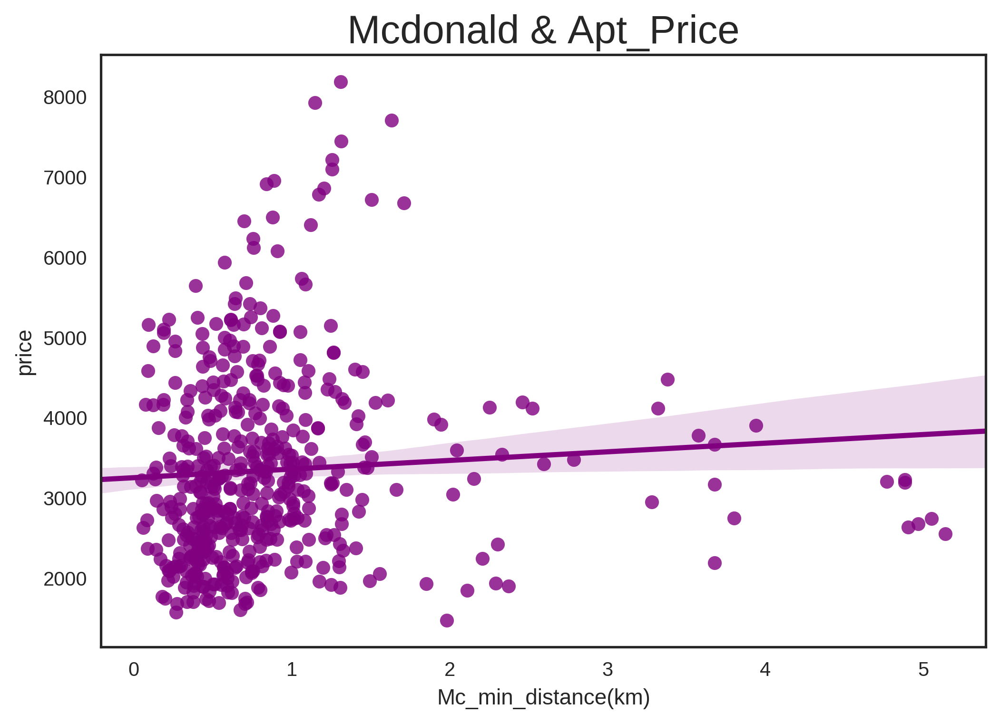

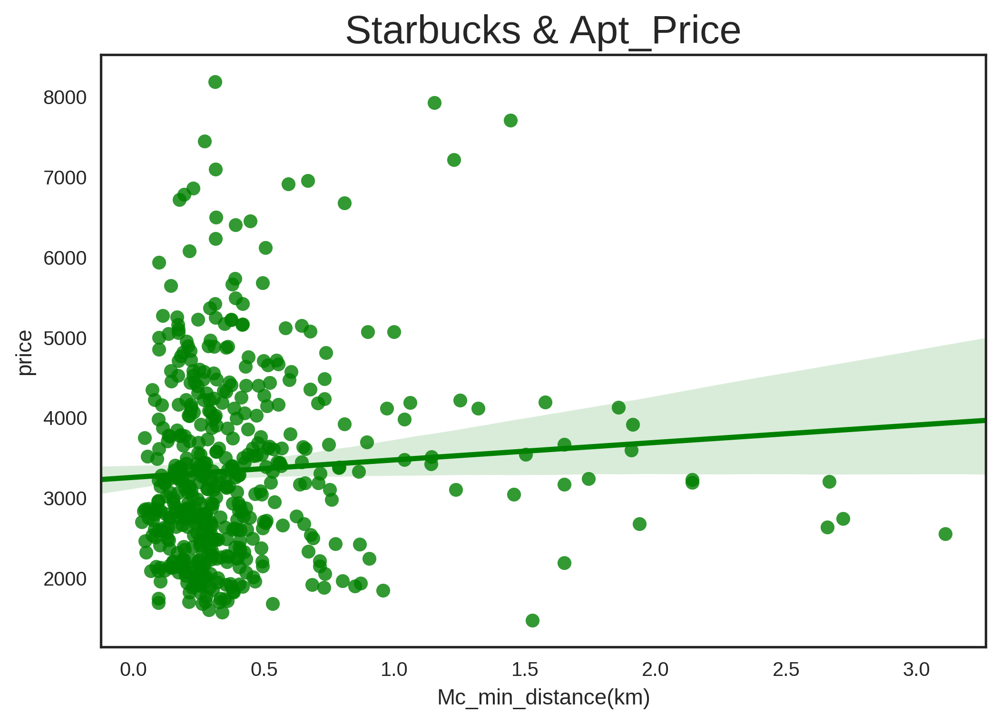

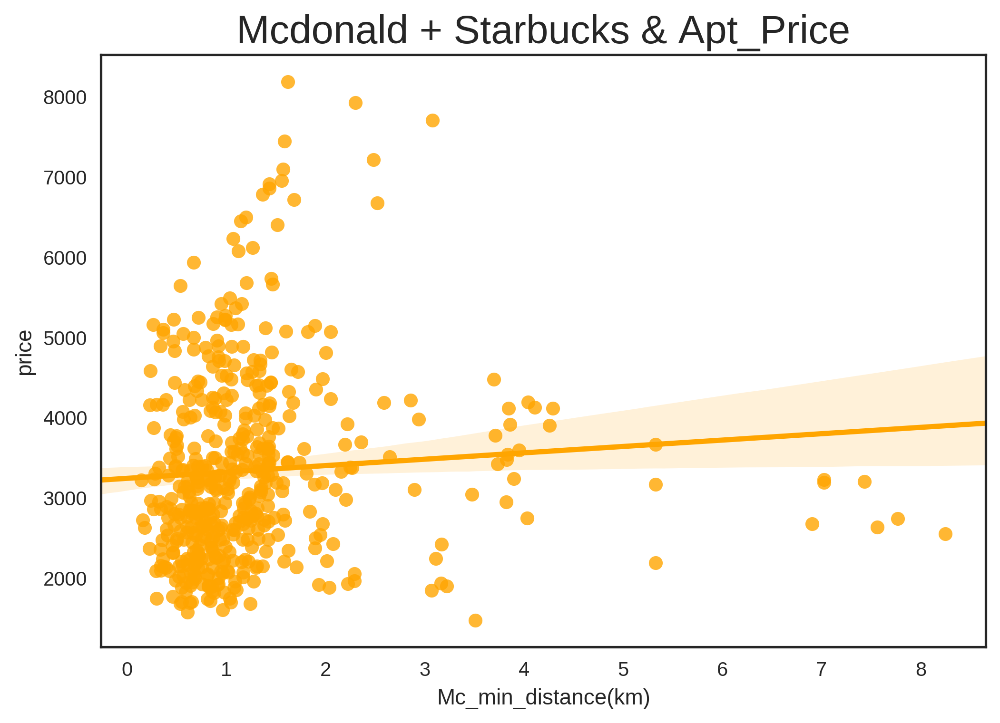

In [25]:
sns.set(style="white", color_codes=True)

sns.regplot(x,z,color="purple")
plt.title("Mcdonald & Apt_Price", fontsize=20)
plt.xlabel("Mc_min_distance(km)")
plt.show()

sns.regplot(y,z, color = "green")
plt.title("Starbucks & Apt_Price", fontsize=20)
plt.xlabel("Mc_min_distance(km)")
plt.show()

sns.regplot(w,z, color = "orange")
plt.title("Mcdonald + Starbucks & Apt_Price", fontsize=20)
plt.xlabel("Mc_min_distance(km)")
plt.show()

### regplot으로 볼 경우에는 우리가 예상한 집 값과 맥도날드 등과의 음의 관계와 반대되는 양의 관계가 나온다. 

### 하지만 위에서 살펴본 jointplot의 p값이 0.1이상이므로 이를 받아들일 수 없다.

 ### 그렇다면 강남과 지리적으로 가까운 다른구의 경우에는 집 값과 맥도날드등의 관계를 추가적으로 살펴보기로 하였다.
### 이하에서는 송파구의 경우에 대해서 알아보도록 하겠다.


### * 송파구의 경우??
#### - 데이터 전처리 과정

In [26]:
songpa_apt= pd.read_table("songpa_gps")

In [27]:
del songpa_apt["시군구"]
del songpa_apt["번지"]
songpa_apt.columns = ["price","lat","long"]

In [28]:
songpa_apt.head()

,price,lat,long
0,1063.574317,37.503922,127.124249
1,1818.966662,37.490358,127.120757
2,1786.093771,37.490236,127.120818
3,1306.758184,37.490116,127.120882
4,2015.783809,37.489756,127.121776


In [29]:
songpa_star = pd.read_table("songpa_star_gps")
songpa_star.head()

,Unnamed: 0,name,lat,long
0,0,아시아선수촌,37.510529,127.079047
1,1,잠실새내역,37.511679,127.081062
2,2,갤러리아팰리스,37.511084,127.093806
3,3,잠실대교남단,37.515511,127.099006
4,4,잠실역,37.515272,127.099231


In [30]:
del songpa_star["Unnamed: 0"]
del songpa_star["name"]

In [31]:
songpa_mc = pd.read_excel("songpa_mc.xlsx")
songpa_mc.head()

,name,lat,long
0,맥도날드 가락DT점,37.502504,127.115273
1,맥도날드 석촌역점,37.505992,127.106915
2,맥도날드 송파 잠실 DT점,37.504365,127.074862
3,맥도날드 신천점,37.511409,127.080578
4,맥도날드 잠실역점,37.511430,127.074012


In [32]:
del songpa_mc["name"]

In [33]:
songpa_mc

,lat,long
0,37.502504,127.115273
1,37.505992,127.106915
2,37.504365,127.074862
3,37.511409,127.080578
4,37.511430,127.074012


In [34]:
min_distance(songpa_apt,songpa_star,"star_min")

In [35]:
min_distance(songpa_apt,songpa_mc,"mc_min")

In [36]:
songpa_apt.head()

,price,lat,long,star_min,mc_min
0,1063.574317,37.503922,127.124249,0.442669,0.807338
1,1818.966662,37.490358,127.120757,0.417047,1.434595
2,1786.093771,37.490236,127.120818,0.426875,1.449204
3,1306.758184,37.490116,127.120882,0.437069,1.463679
4,2015.783809,37.489756,127.121776,0.462913,1.529236


In [37]:
x_1 = songpa_apt["mc_min"]
y_1 = songpa_apt["star_min"]
z_1 = songpa_apt["price"]
w_1 = x_1+y_1


#### 강남구와 같은 흐름으로 distplot, jointplot, regplot에 대해서 살펴보도록 하겠다.

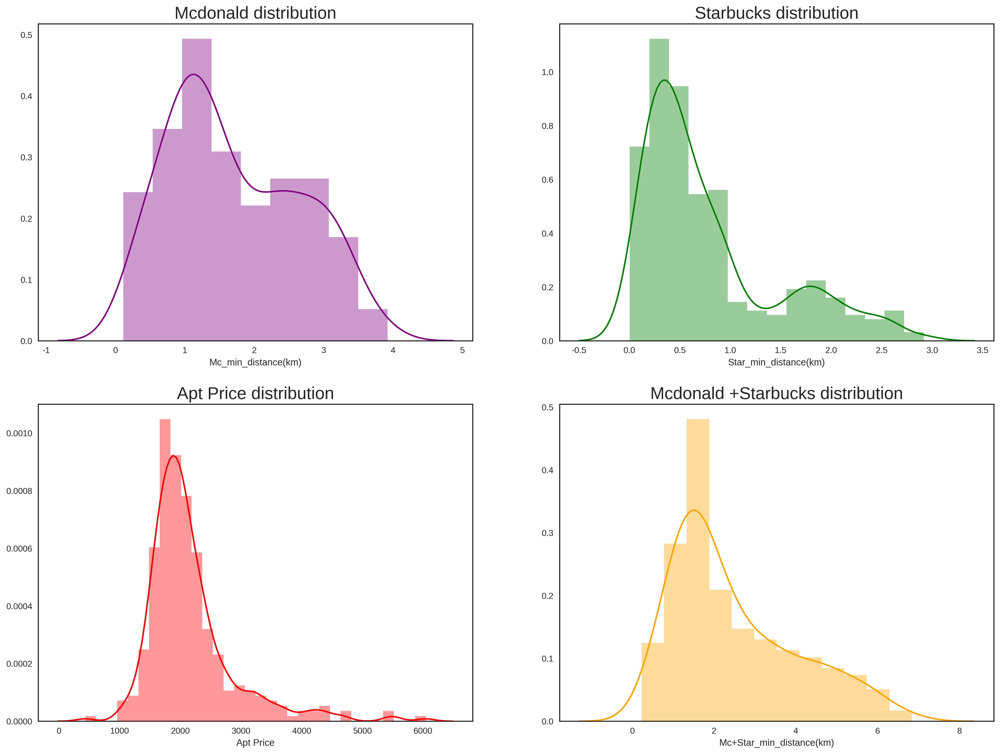

In [38]:
sns.set(style="white", color_codes=True)
fig = plt.figure(1, figsize=(20,15))

plt.subplot(221)
sns.distplot(x_1,color="purple")
plt.title("Mcdonald distribution", fontsize=20)
plt.xlabel("Mc_min_distance(km)")

plt.subplot(222)
sns.distplot(y_1, color = "green")
plt.title("Starbucks distribution", fontsize=20)
plt.xlabel("Star_min_distance(km)")

plt.subplot(223)
sns.distplot(z_1, color = "red")
plt.title("Apt Price distribution", fontsize=20)
plt.xlabel("Apt Price")

plt.subplot(224)
sns.distplot(w_1, color = "orange")
plt.title("Mcdonald +Starbucks distribution", fontsize=20)
plt.xlabel("Mc+Star_min_distance(km)")
plt.show()

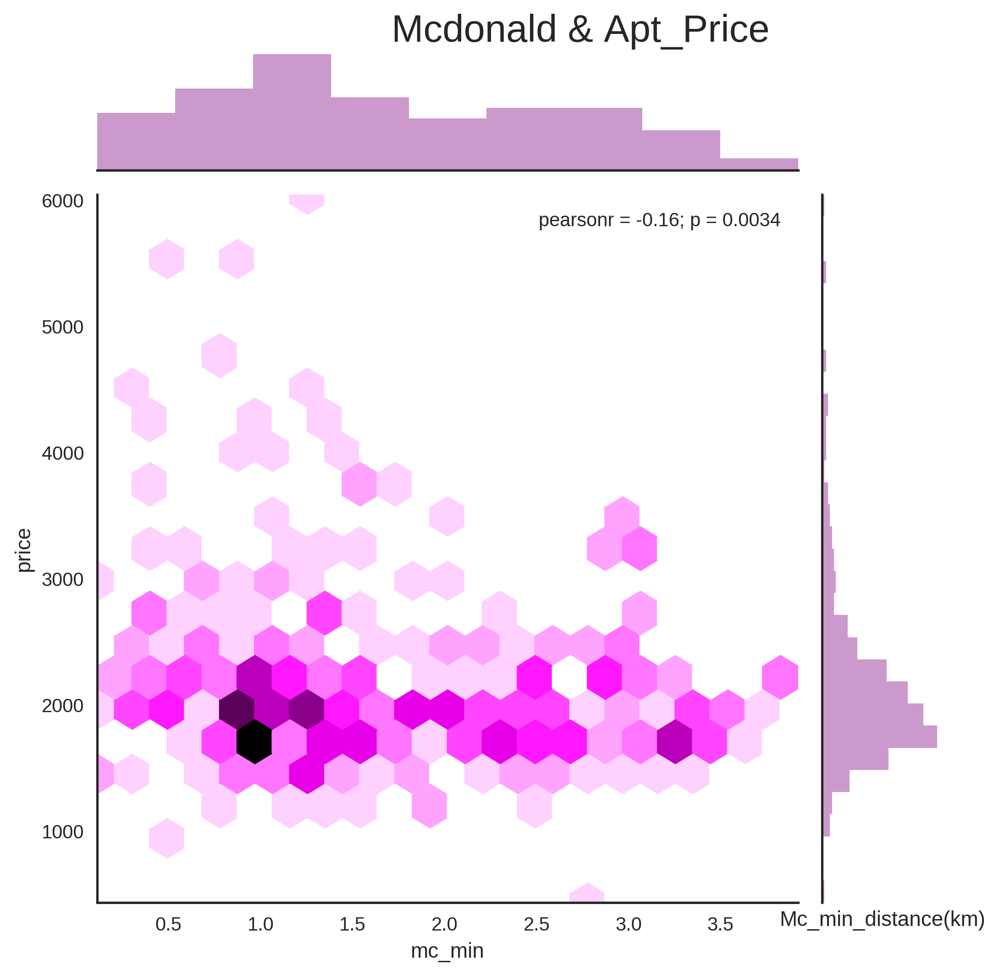

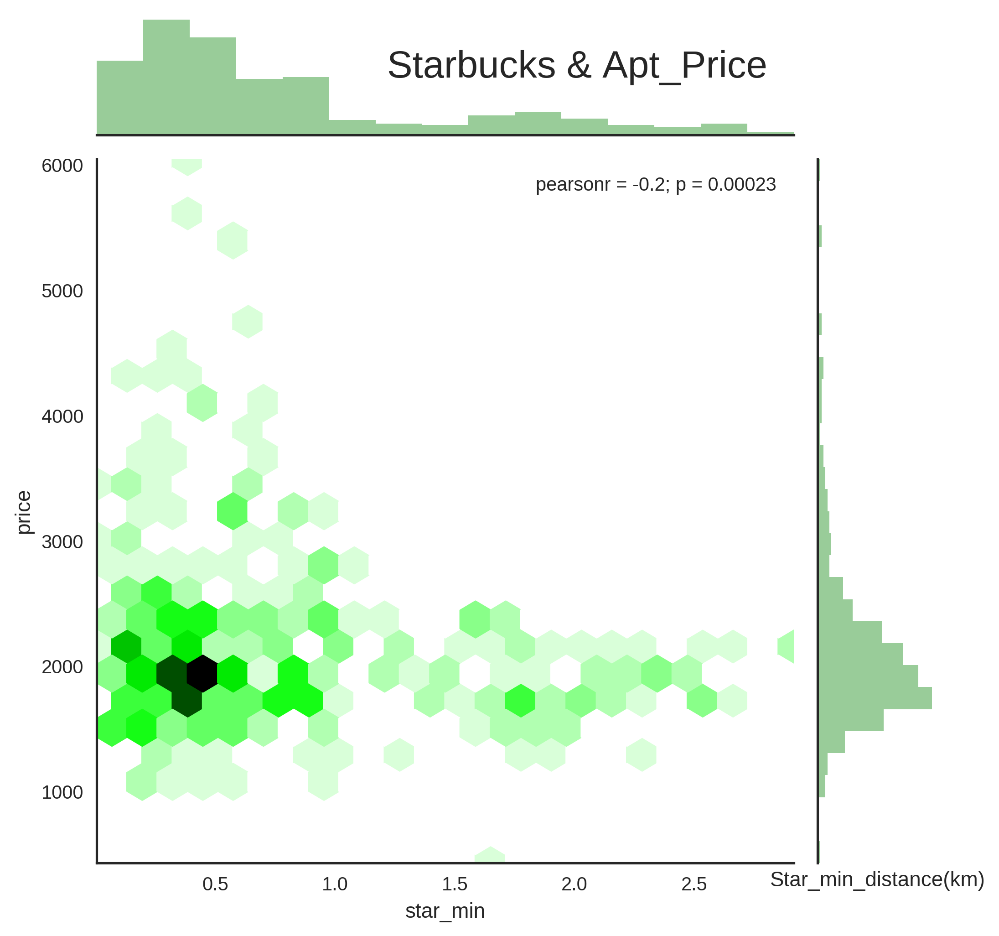

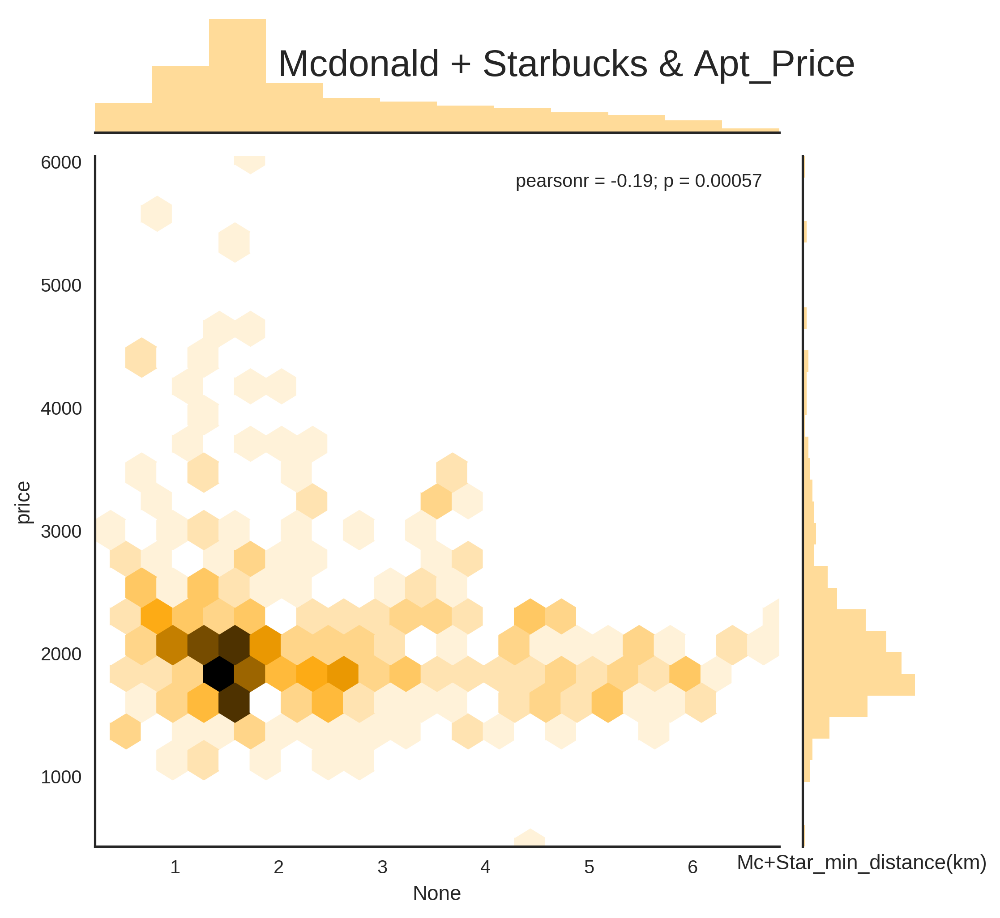

In [53]:
sns.set(style="white", color_codes=True)


sns.jointplot(x_1,z_1, color="purple", size=7, kind="hex")
plt.title("Mcdonald & Apt_Price", fontsize=20, position=(-2, 1.2))
plt.xlabel("Mc_min_distance(km)")

ax2 =sns.jointplot(y_1,z_1, color = "green", size=7, kind="hex")
plt.title("Starbucks & Apt_Price", fontsize=20,position=(-2, 1.1))
plt.xlabel("Star_min_distance(km)")

ax3 = sns.jointplot(w_1,z_1, color = "orange", size=7, kind="hex")
plt.title("Mcdonald + Starbucks & Apt_Price", fontsize=20,position=(-2, 1.1))
plt.xlabel("Mc+Star_min_distance(km)")

plt.show()

### 송파구의 경우에는 강남구와 다르게 p값이 0.01미만으로 나와서 상관관계를 받아들일 수가 있다.
### 음의 상관관계가 보이며 이를 regplot으로 그려보면 아래와 같다.

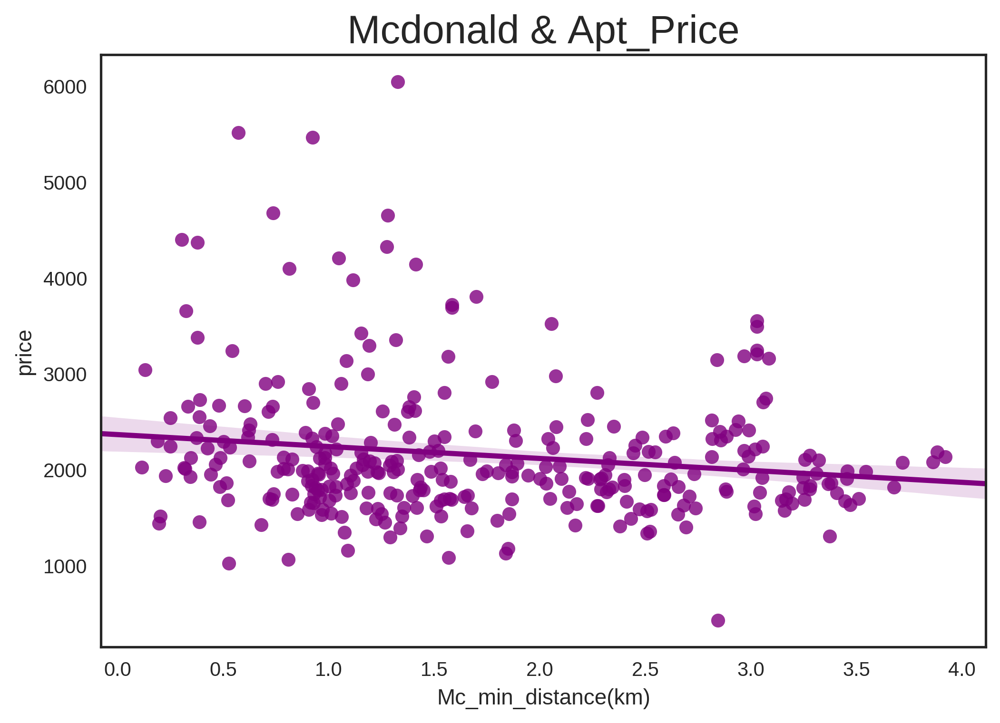

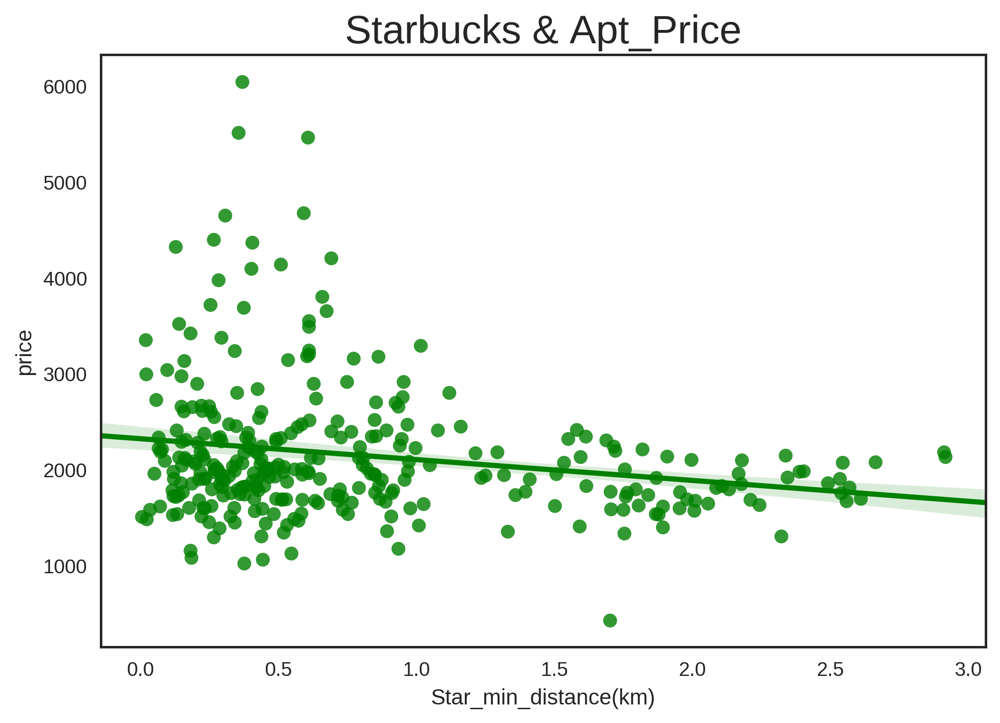

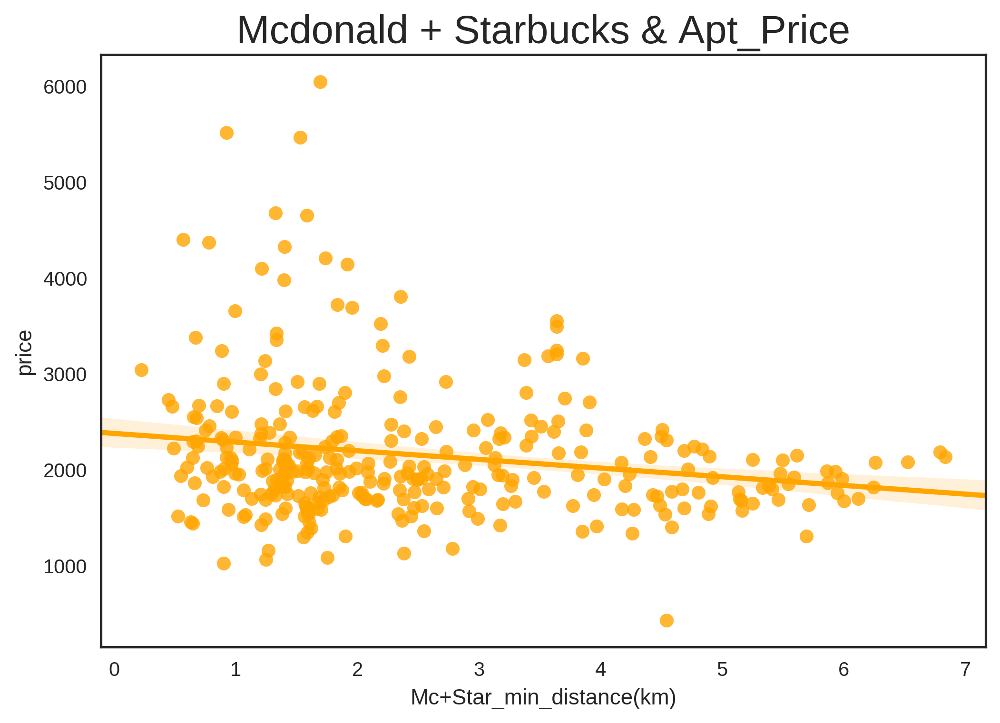

In [54]:
sns.set(style="white", color_codes=True)

sns.regplot(x_1,z_1,color="purple")
plt.title("Mcdonald & Apt_Price", fontsize=20)
plt.xlabel("Mc_min_distance(km)")
plt.show()

sns.regplot(y_1,z_1, color = "green")
plt.title("Starbucks & Apt_Price", fontsize=20)
plt.xlabel("Star_min_distance(km)")
plt.show()

sns.regplot(w_1,z_1, color = "orange")
plt.title("Mcdonald + Starbucks & Apt_Price", fontsize=20)
plt.xlabel("Mc+Star_min_distance(km)")
plt.show()

### 스타벅스와의 거리, 맥도날드와의 거리 , 이 둘의 합 모두 음의관계가 나오는 것을 알 수 있다.
### 즉 우리가 가정한 스타벅스 및 맥도날드가 주변에 있을 수록 땅 값이 비싸다와 일치하는 지역이다.

### 또한 상관관계 값을 구하면 아래와 같다.

- 강남의 경우 양의 상관관계(0.07)를, 송파의 경우 음의 상관관계(-0.2~-0.16)를 갖는 것을 알 수 있다.

In [41]:
def heatmap(df):
    corr = df.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        ax = sns.heatmap(corr, mask=mask, vmax=.5, square=True,cmap="BuGn",annot=True)
    plt.show()
    return ax

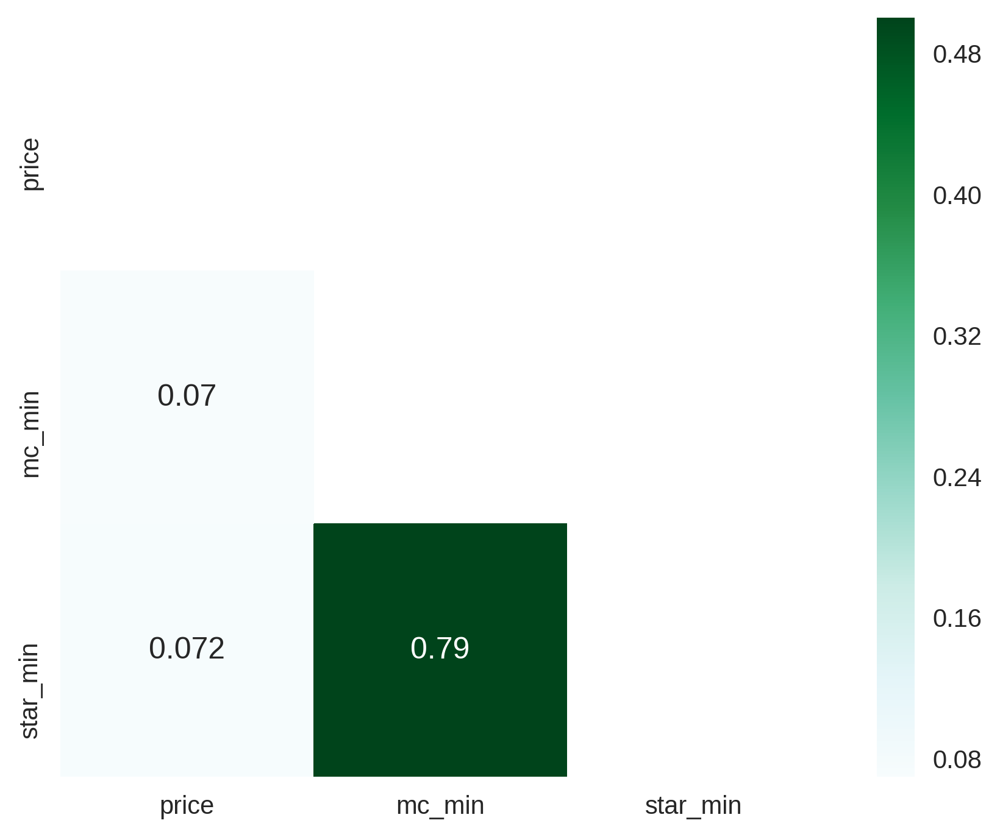

In [42]:
heatmap(df_apt.iloc[:,[0,3,4]])

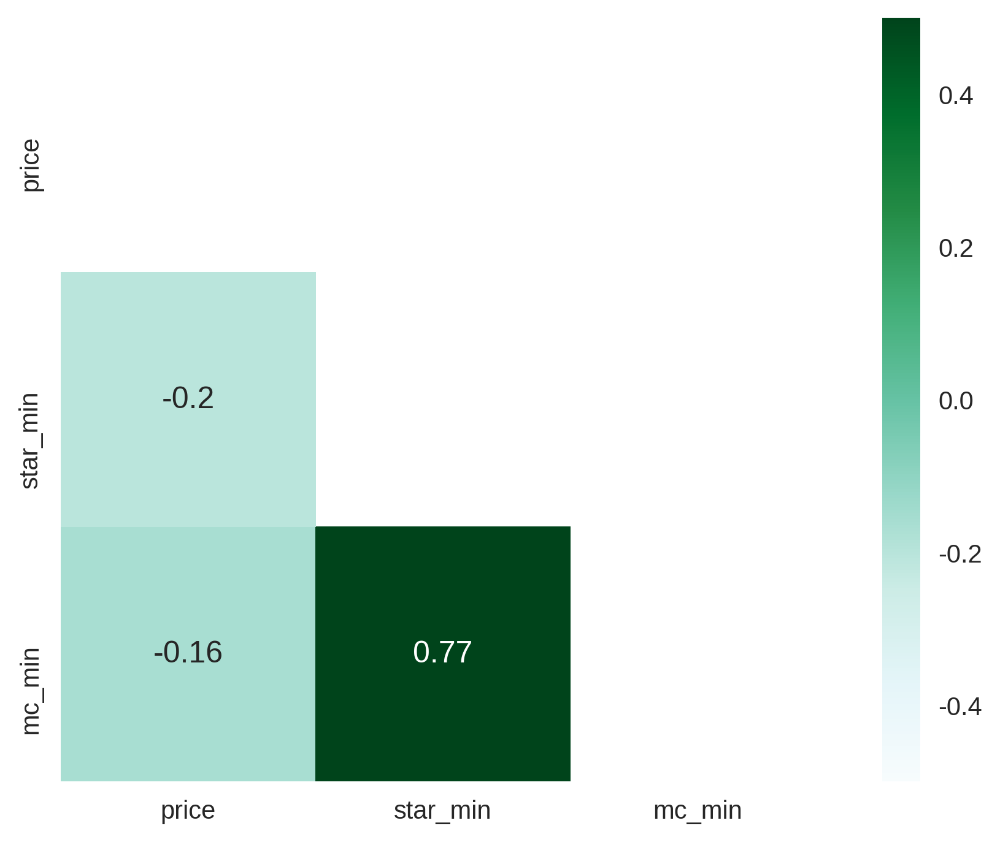

In [43]:
heatmap(songpa_apt.iloc[:,[0,3,4]])

# 4.그렇다면 강남의 경우에는 왜 가정이 성립하지 않는 것일까?

### * 기타 정보 등으로 원인 추측(추후 분석과제)

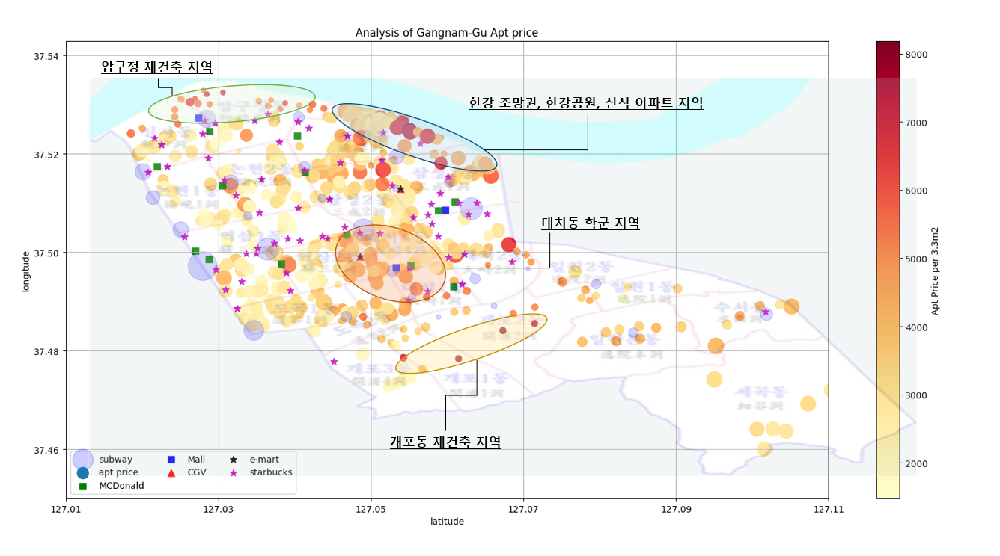

In [137]:
Image("aaa.png")

- 분석의 용이성을 위해서 지하철 및 편의시설을 추가했으며, 건축년도에 따라서 원의크기를 다르게 하였다.

## 1) 주거지역 및 상업시설의 혼재

#### 수 많은 상업시설(은행, 회사 등)이 모여있으며 이러한 유동인구를 target으로 스타벅스 및 맥도날드 등이 위치해 있다.
#### 하지만 우리가 고려한 것은 아파트의 평당 가격이어서 거주지역에 대해서만 고려한 것이라 유동인구 등에 대해 고려하지 못했다.

## 2) 땅 값에 미치는 다양한 영향

#### 2-1) 개포동, 압구정동 재건축
#### 2-2) 한강조망권과 숲세권
#### 2-3)대치동 학군

#### 등 다양한 요인이 아파트 가격을 결정하고 있어서 맥도날드 등과의 관계가 뚜렷하지 못했다.

# 5. 추후과제(further study)

###  1) 서울 전체에 대해서 분석해보기
- 서울 전체 데이터로 상관관계 있는지 살펴보고, 개별 구마다 검토하기

###  2) 다른 편의 시설의 유무도 고려하기 
 - 스타벅스, 맥도날드 및 다른 편의시설 유무도 고려하기

### 3) 아파트 뿐만 아니라 다른 주거형태(원룸, 빌딩) 및 빌딩 등 고려하기

### 4) 강남의 경우 땅 값에 미치는 요인에 대해서 검토해보기